In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/lgg-mri-segmentation/kaggle_3m/README.md
/kaggle/input/lgg-mri-segmentation/kaggle_3m/data.csv
/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_45.tif
/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_56_mask.tif
/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_57.tif
/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_33.tif
/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_27.tif
/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_52.tif
/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_10.tif
/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_8_mask.tif
/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_DU_7010_19860307/TCGA_DU_7010_19860307_34_mask.tif
/kaggle/input

In [15]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
import cv2
from skimage import io
import tensorflow as tf
from tensorflow.python.keras import Sequential
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.initializers import glorot_uniform
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from IPython.display import display
from tensorflow.keras import backend as K
from sklearn.preprocessing import StandardScaler, normalize
import os
import glob
import random
from pathlib import Path
from sklearn.model_selection import train_test_split
from tqdm import tqdm

In [6]:
import os

base_path = "/kaggle/input/lgg-mri-segmentation/kaggle_3m"
print("first pic :", len(os.listdir(base_path)))
os.listdir(base_path)[:2]

first pic : 112


['TCGA_DU_7010_19860307', 'TCGA_DU_8162_19961029']

In [7]:
  import os

  # Define the path to the specific subdirectory
  subdirectory_path = os.path.join(base_path, 'TCGA_CS_5396_20010302')

  # List the contents of the subdirectory
  files_in_subdirectory = os.listdir(subdirectory_path)

  print(f"Contents of '{subdirectory_path}':")
  print(files_in_subdirectory)

Contents of '/kaggle/input/lgg-mri-segmentation/kaggle_3m/TCGA_CS_5396_20010302':
['TCGA_CS_5396_20010302_17.tif', 'TCGA_CS_5396_20010302_19.tif', 'TCGA_CS_5396_20010302_3.tif', 'TCGA_CS_5396_20010302_16.tif', 'TCGA_CS_5396_20010302_20_mask.tif', 'TCGA_CS_5396_20010302_3_mask.tif', 'TCGA_CS_5396_20010302_15.tif', 'TCGA_CS_5396_20010302_13.tif', 'TCGA_CS_5396_20010302_24.tif', 'TCGA_CS_5396_20010302_21_mask.tif', 'TCGA_CS_5396_20010302_10_mask.tif', 'TCGA_CS_5396_20010302_11_mask.tif', 'TCGA_CS_5396_20010302_12_mask.tif', 'TCGA_CS_5396_20010302_23.tif', 'TCGA_CS_5396_20010302_22_mask.tif', 'TCGA_CS_5396_20010302_8_mask.tif', 'TCGA_CS_5396_20010302_21.tif', 'TCGA_CS_5396_20010302_10.tif', 'TCGA_CS_5396_20010302_6_mask.tif', 'TCGA_CS_5396_20010302_22.tif', 'TCGA_CS_5396_20010302_14.tif', 'TCGA_CS_5396_20010302_24_mask.tif', 'TCGA_CS_5396_20010302_9.tif', 'TCGA_CS_5396_20010302_2_mask.tif', 'TCGA_CS_5396_20010302_15_mask.tif', 'TCGA_CS_5396_20010302_23_mask.tif', 'TCGA_CS_5396_20010302_9_m

In [8]:
image_paths = []
mask_paths = []

for dirpath, dirnames, filenames in os.walk(base_path):
    for filename in filenames:
        if filename.endswith('.tif'):
            if '_mask' in filename:
                mask_paths.append(os.path.join(dirpath, filename))
            else:
                image_paths.append(os.path.join(dirpath, filename))

print(f'Number of images: {len(image_paths)}')
print(f'Number of masks: {len(mask_paths)}')

Number of images: 3929
Number of masks: 3929


In [9]:
import pandas as pd
import os

data = []

for image_path in image_paths:
    patient_id = os.path.basename(os.path.dirname(image_path))
    mask_path = image_path.replace('.tif', '_mask.tif')

    # Ensure the constructed mask_path actually exists in our collected mask_paths
    # This check is crucial to prevent mismatches or non-existent mask files
    if mask_path in mask_paths:
        data.append({
            'patient_id': patient_id,
            'image_path': image_path,
            'mask_path': mask_path
        })
    else:
        print(f"Warning: Mask not found for image: {image_path}")

brain_df = pd.DataFrame(data)

print("DataFrame created successfully.")
display(brain_df.head())

DataFrame created successfully.


,patient_id,image_path,mask_path
0,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
1,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
2,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
3,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...
4,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...


In [10]:
has_tumor_list = []

for mask_path in brain_df['mask_path']:
    mask_image = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    if mask_image.max() > 0:
        has_tumor_list.append(True)
    else:
        has_tumor_list.append(False)

brain_df['mask'] = has_tumor_list

print("'has_tumor' column added to brain_df.")
display(brain_df.head())

'has_tumor' column added to brain_df.


,patient_id,image_path,mask_path,mask
0,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,True
1,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,False
2,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,True
3,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,True
4,TCGA_DU_7010_19860307,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,False


In [11]:
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

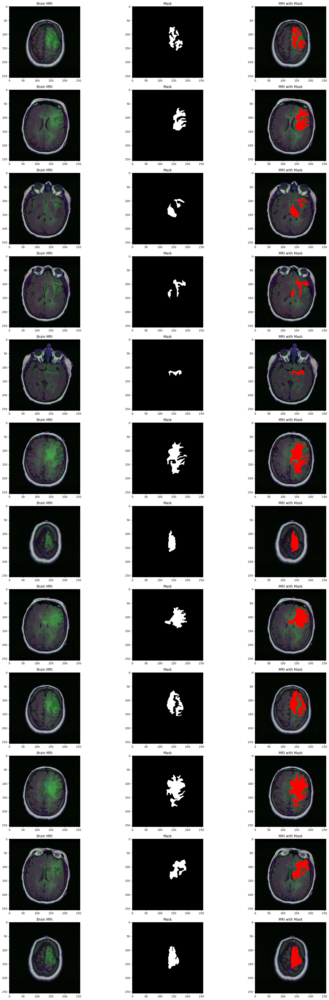

In [12]:

# Advanced Visualization: visualize the MRI scans along with their mask on one image
count = 0
fig, axs = plt.subplots(12,3, figsize=(20,50))
for i in range(len(brain_df)):
  if brain_df_train['mask'][i] == 1 and count < 12:
  # read the images
    img = io.imread(brain_df_train.image_path[i])
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # obtain the mask for the image
    mask = io.imread(brain_df_train.mask_path[i])
    axs[count][1].title.set_text("Mask")
    axs[count][1].imshow(mask, cmap = 'gray')

    # replace the values in the image with red color (255,0,0) if any mask pixel in the mask was = 255
    img[mask == 255] = (255,0,0)
    axs[count][2].title.set_text("MRI with Mask")
    axs[count][2].imshow(img)
    count += 1

fig.tight_layout()

mask
False    2556
True     1373
Name: count, dtype: int64


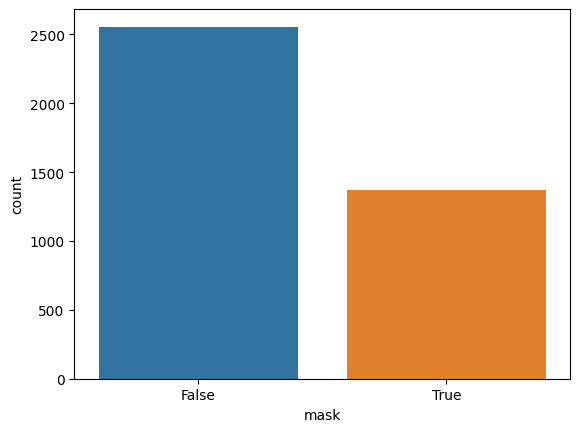

In [13]:
sns.countplot(x = 'mask', data = brain_df_train)
print(brain_df_train['mask'].value_counts())

In [14]:
brain_df_train['mask'] = brain_df_train['mask'].astype(int)

print("Converting 'has_tumor' column to integer:")
display(brain_df_train.head())
print("\nUpdated DataFrame info:")
brain_df_train.info()

Converting 'has_tumor' column to integer:


,image_path,mask_path,mask
0,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,1
1,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0
2,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,1
3,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,1
4,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,/kaggle/input/lgg-mri-segmentation/kaggle_3m/T...,0



Updated DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   int64 
dtypes: int64(1), object(2)
memory usage: 92.2+ KB


In [16]:
# Create YOLO directory structure
base_dir = 'Brain_Tumor_YOLO'
os.makedirs(f'{base_dir}/images/train', exist_ok=True)
os.makedirs(f'{base_dir}/images/val', exist_ok=True)
os.makedirs(f'{base_dir}/labels/train', exist_ok=True)
os.makedirs(f'{base_dir}/labels/val', exist_ok=True)

In [17]:
train_df, val_df = train_test_split(brain_df_train, test_size=0.15, random_state=42)

In [18]:
def mask_to_yolo_polygon(mask_path, image_size=224):
    """Convert binary mask to YOLO polygon format (normalized coordinates)"""
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

    if mask is None:
        return None

    # Find contours in the mask
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) == 0:
        return None

    polygons = []
    for contour in contours:
        if cv2.contourArea(contour) > 100:  # Filter small contours (noise)
            # Approximate contour to reduce points
            epsilon = 0.002 * cv2.arcLength(contour, True)
            approx = cv2.approxPolyDP(contour, epsilon, True)

            # Normalize coordinates to [0, 1]
            polygon = approx.reshape(-1, 2)
            polygon = polygon.astype(float) / image_size
            polygons.append(polygon)

    return polygons

In [19]:
def process_dataset(dataframe, split_type, base_dir):
    """Process dataset and convert to YOLO format"""

    for idx, row in tqdm(dataframe.iterrows(), total=len(dataframe), desc=f"Processing {split_type}"):
        try:
            image_path = row['image_path']
            mask_path = row['mask_path']
            has_tumor = row['mask']  # 0 or 1

            # Read image
            image = cv2.imread(image_path)
            if image is None:
                continue

            # Generate output filename
            filename = f"brain_tumor_{split_type}_{idx}.jpg"

            # Save image
            output_image_path = f"{base_dir}/images/{split_type}/{filename}"
            cv2.imwrite(output_image_path, image)

            # Create YOLO annotation (class 0 = tumor)
            output_label_path = f"{base_dir}/labels/{split_type}/{filename.replace('.jpg', '.txt')}"

            if has_tumor == 1:  # If mask exists (tumor present)
                polygons = mask_to_yolo_polygon(mask_path, image.shape[0])

                if polygons:
                    with open(output_label_path, 'w') as f:
                        for polygon in polygons:
                            # Class 0 for tumor
                            coords = ' '.join([f"{x:.6f} {y:.6f}" for x, y in polygon])
                            f.write(f"0 {coords}\n")
                else:
                    # Image with no detectable contours (create empty annotation)
                    with open(output_label_path, 'w') as f:
                        pass
            else:
                # No tumor - create empty annotation file
                with open(output_label_path, 'w') as f:
                    pass

        except Exception as e:
            print(f"Error processing index {idx}: {e}")
            continue

# Process train and validation sets
print("Processing training data...")
process_dataset(train_df, 'train', base_dir)

print("Processing validation data...")
process_dataset(val_df, 'val', base_dir)

Processing training data...


Processing train: 100%|██████████| 3339/3339 [00:46<00:00, 72.45it/s]


Processing validation data...


Processing val: 100%|██████████| 590/590 [00:08<00:00, 69.15it/s]


In [20]:
# Create data.yaml for YOLO
yaml_content = """path: /path/to/Brain_Tumor_YOLO  # Update this path
train: images/train
val: images/val

nc: 1  # number of classes
names: ['tumor']  # class names
"""

In [21]:
with open(f'{base_dir}/data.yaml', 'w') as f:
    f.write(yaml_content)

print(f"\n✓ Dataset converted successfully!")
print(f"Location: {base_dir}/")
print(f"Training images: {len(os.listdir(f'{base_dir}/images/train'))}")
print(f"Validation images: {len(os.listdir(f'{base_dir}/images/val'))}")


✓ Dataset converted successfully!
Location: Brain_Tumor_YOLO/
Training images: 3339
Validation images: 590


In [23]:
!pip install ultralytics


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.9 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of mkl-fft to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of mkl-random to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of mkl-umath to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 84.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 89.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 68.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [24]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [25]:
import os

# Check the existence of files
print("Train images:", len(os.listdir('Brain_Tumor_YOLO/images/train')))
print("Val images:", len(os.listdir('Brain_Tumor_YOLO/images/val')))
print("Train labels:", len(os.listdir('Brain_Tumor_YOLO/labels/train')))
print("Val labels:", len(os.listdir('Brain_Tumor_YOLO/labels/val')))

# Display the content of data.yaml
with open('Brain_Tumor_YOLO/data.yaml', 'r') as f:
    print(f.read())


Train images: 3339
Val images: 590
Train labels: 3339
Val labels: 590
path: /path/to/Brain_Tumor_YOLO  # Update this path
train: images/train
val: images/val

nc: 1  # number of classes
names: ['tumor']  # class names



In [26]:
import os

# Get the absolute path of the dataset
yaml_path = os.path.abspath('Brain_Tumor_YOLO')

# Write the data.yaml file with the correct path
yaml_content = f"""path: {yaml_path}
train: images/train
val: images/val

nc: 1
names: ['tumor']
"""

with open('Brain_Tumor_YOLO/data.yaml', 'w') as f:
    f.write(yaml_content)

# Verify the content
print("Updated data.yaml:")
with open('Brain_Tumor_YOLO/data.yaml', 'r') as f:
    print(f.read())


Updated data.yaml:
path: /kaggle/working/Brain_Tumor_YOLO
train: images/train
val: images/val

nc: 1
names: ['tumor']



In [27]:
from ultralytics import YOLO

model = YOLO('yolov8n-seg.pt')

results = model.train(
    data='Brain_Tumor_YOLO/data.yaml',
    
    # Epochs
    epochs=100,  # increased from 50 to 100 (longer training)
    imgsz=512,
    
    # Learning rate - very important
    lr0=0.001,      # better initial learning rate
    lrf=0.0001,     # final learning rate
    
    # Batch size - important for accuracy
    batch=32,       # bigger batch = better results
    
    # Optimizer and momentum
    optimizer='SGD',      # better than default
    momentum=0.937,       # recommended value
    weight_decay=0.0005,  # light regularization
    
    # Data Augmentation - light and safe
    hsv_h=0.005,      # very slight hue change
    hsv_s=0.2,        # very slight saturation change
    hsv_v=0.15,       # very slight brightness change
    
    degrees=10,       # small rotation (10 degrees only)
    translate=0.05,   # very small translation
    scale=0.1,        # light scaling (10% only)
    flipud=0.2,       # rare vertical flip
    fliplr=0.2,       # rare horizontal flip
    
    mosaic=0.8,       # moderate mosaic
    mixup=0.01,       # very slight mixup
    
    # Early Stopping
    patience=20,      # stop after 20 epochs without improvement
    
    # Other
    device=0,
    workers=4,
    save=True,
    verbose=True,
    
    # Optional:
    # resume=True,  # resume if stopped accidentally
)

print("\n" + "="*60)
print("✓ Training finished!")
print("="*60)
print("\nSettings used:")
print("  • Epochs: 100 (double the original)")
print("  • Batch Size: 32 (larger)")
print("  • Learning Rate: optimized")
print("  • Augmentation: light and safe")
print("\nExpected results:")
print("  • Recall will increase (detect more tumors)")
print("  • Precision will remain high or slightly improve")
print("  • Overall accuracy will improve")
print("="*60)


Ultralytics 8.3.229 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=Brain_Tumor_YOLO/data.yaml, degrees=10, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.2, flipud=0.2, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.005, hsv_s=0.2, hsv_v=0.15, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.0001, mask_ratio=4, max_det=300, mixup=0.01, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=0.8, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=20, perspective=0.0, plots=True, pose

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        590        224      0.867      0.874      0.914      0.676      0.895      0.812       0.89      0.601
Speed: 0.1ms preprocess, 2.0ms inference, 0.0ms loss, 2.2ms postprocess per image
Results saved to /kaggle/working/runs/segment/train

✓ Training finished!

Settings used:
  • Epochs: 100 (double the original)
  • Batch Size: 32 (larger)
  • Learning Rate: optimized
  • Augmentation: light and safe

Expected results:
  • Recall will increase (detect more tumors)
  • Precision will remain high or slightly improve
  • Overall accuracy will improve


In [28]:
def detect_tumor(image_path):
    """Detect tumors in a single image"""

    # Prediction
    results = model.predict(image_path, conf=0.5, verbose=False)
    result = results[0]

    # Read the original image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Draw results
    annotated = result.plot()[:, :, ::-1]

    # Display results
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    axes[0].imshow(image_rgb)
    axes[0].set_title('Original Image', fontsize=14)
    axes[0].axis('off')

    axes[1].imshow(annotated)
    axes[1].set_title(f'Detection: {len(result.boxes)} tumor(s)', 
                      fontsize=14, 
                      color='green' if len(result.boxes) > 0 else 'red')
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()

    # Print results
    print(f"\n{'='*50}")
    print(f"File: {Path(image_path).name}")
    print(f"{'='*50}")
    if len(result.boxes) > 0:
        print(f"✓ Detected {len(result.boxes)} tumor(s):\n")
        for i, box in enumerate(result.boxes):
            conf = box.conf.item()
            print(f"  Tumor {i+1}: Confidence = {conf:.2%}")
    else:
        print("✗ No tumors detected")
    print(f"{'='*50}\n")

    return result


Detecting tumors...


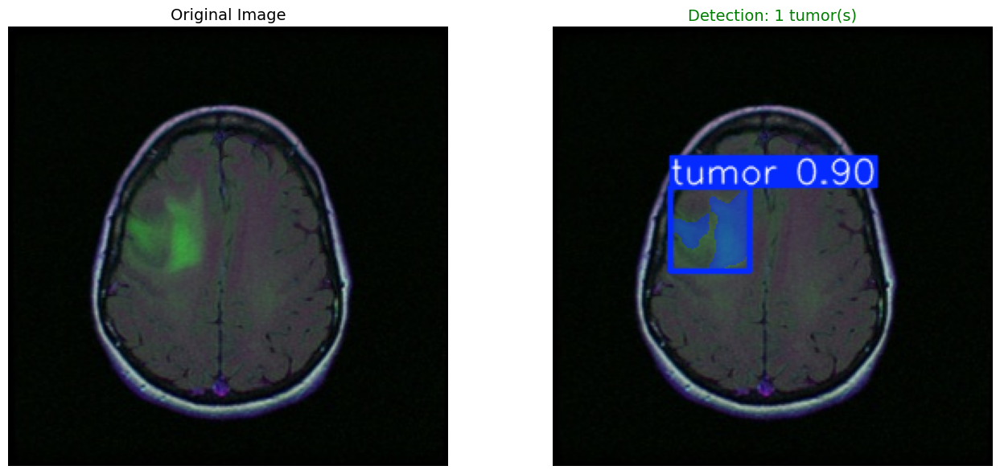


File: brain_tumor_val_3383.jpg
✓ Detected 1 tumor(s):

  Tumor 1: Confidence = 89.57%


Analyzing all test images


In [30]:
print("Detecting tumors...")

# Get all validation images
val_images = list(Path('Brain_Tumor_YOLO/images/val').glob('*.jpg'))

if val_images:
    # Pick a random image (here the 13th image)
    test_image = val_images[10]
    result = detect_tumor(str(test_image))

# Method 2: Process all validation images
print("\n" + "="*50)
print("Analyzing all test images")
print("="*50)


Searching for images with tumors... (590 images)

✓ Found 5 images containing tumors



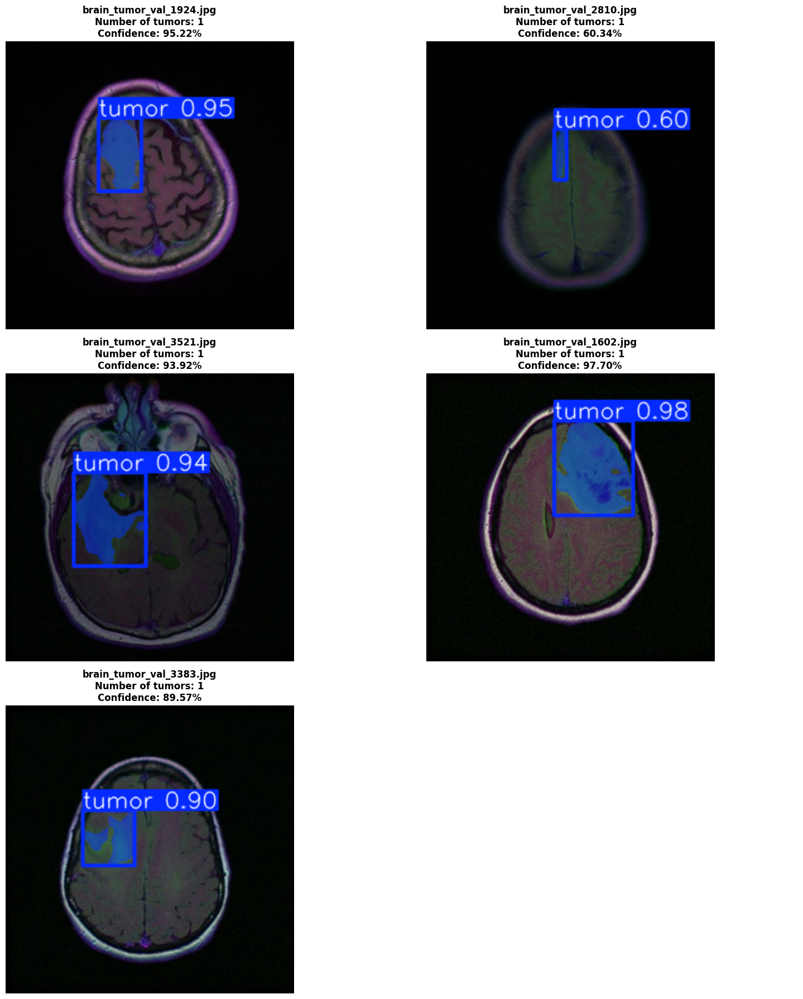


Detailed information about the images:

📷 Image 1: brain_tumor_val_1924.jpg
   Number of tumors: 1
   Average confidence: 95.22%
   Confidence per tumor:
      Tumor 1: 95.22%

📷 Image 2: brain_tumor_val_2810.jpg
   Number of tumors: 1
   Average confidence: 60.34%
   Confidence per tumor:
      Tumor 1: 60.34%

📷 Image 3: brain_tumor_val_3521.jpg
   Number of tumors: 1
   Average confidence: 93.92%
   Confidence per tumor:
      Tumor 1: 93.92%

📷 Image 4: brain_tumor_val_1602.jpg
   Number of tumors: 1
   Average confidence: 97.70%
   Confidence per tumor:
      Tumor 1: 97.70%

📷 Image 5: brain_tumor_val_3383.jpg
   Number of tumors: 1
   Average confidence: 89.57%
   Confidence per tumor:
      Tumor 1: 89.57%



In [32]:
from ultralytics import YOLO
import cv2
import matplotlib.pyplot as plt
from pathlib import Path
import numpy as np


def get_tumor_images(image_dir, num_images=5, conf=0.5):
    """Fetch images that contain tumors only"""

    val_dir = Path(image_dir)
    all_images = list(val_dir.glob('*.jpg'))

    tumor_images = []

    print(f"Searching for images with tumors... ({len(all_images)} images)")

    for img_path in all_images:
        # Prediction
        results = model.predict(str(img_path), conf=conf, verbose=False)
        result = results[0]

        # If tumors are detected
        if len(result.boxes) > 0:
            tumor_images.append({
                'path': img_path,
                'num_tumors': len(result.boxes),
                'result': result,
                'confidences': [box.conf.item() for box in result.boxes]
            })

            # Stop after collecting the required number
            if len(tumor_images) >= num_images:
                break

    return tumor_images

# Fetch 5 images containing tumors
tumor_imgs = get_tumor_images('Brain_Tumor_YOLO/images/val', num_images=5, conf=0.5)

print(f"\n✓ Found {len(tumor_imgs)} images containing tumors\n")

# Display images
if tumor_imgs:
    num_images = len(tumor_imgs)
    cols = 2
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(16, 6*rows))

    # Handle single image case
    if num_images == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for idx, img_data in enumerate(tumor_imgs):
        # Read the image
        image = cv2.imread(str(img_data['path']))
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Draw results
        annotated = img_data['result'].plot()[:, :, ::-1]

        # Show annotated image
        axes[idx].imshow(annotated)

        # Title with details
        title = f"{img_data['path'].name}\n"
        title += f"Number of tumors: {img_data['num_tumors']}\n"
        title += f"Confidence: {np.mean(img_data['confidences']):.2%}"

        axes[idx].set_title(title, fontsize=12, fontweight='bold')
        axes[idx].axis('off')

    # Hide empty axes
    for idx in range(num_images, len(axes)):
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

# Print detailed information
print("\n" + "="*60)
print("Detailed information about the images:")
print("="*60)

for idx, img_data in enumerate(tumor_imgs, 1):
    print(f"\n📷 Image {idx}: {img_data['path'].name}")
    print(f"   Number of tumors: {img_data['num_tumors']}")
    print(f"   Average confidence: {np.mean(img_data['confidences']):.2%}")
    print(f"   Confidence per tumor:")
    for i, conf in enumerate(img_data['confidences'], 1):
        print(f"      Tumor {i}: {conf:.2%}")

print("\n" + "="*60)


In [ ]:
model2 = YOLO('yolov8m-seg.pt')  

results = model2.train(
    data='Brain_Tumor_YOLO/data.yaml',
    
    epochs=50,  
    imgsz=512,
    
    lr0=0.001,
    lrf=0.0001,
    
    batch=32,
    
    optimizer='SGD',
    momentum=0.937,
    weight_decay=0.0005,
    
    # Augmentation
    hsv_h=0.005,
    hsv_s=0.2,
    hsv_v=0.15,
    degrees=10,
    translate=0.05,
    scale=0.1,
    flipud=0.2,
    fliplr=0.2,
    mosaic=0.8,
    mixup=0.01,
    
    patience=10, 
    
    device=0,
    workers=4,
    save=True,
    verbose=True,
)

Ultralytics 8.3.229 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=Brain_Tumor_YOLO/data.yaml, degrees=10, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.2, flipud=0.2, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.005, hsv_s=0.2, hsv_v=0.15, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.0001, mask_ratio=4, max_det=300, mixup=0.01, mode=train, model=yolov8m-seg.pt, momentum=0.937, mosaic=0.8, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=SGD, overlap_mask=True, patience=10, perspective=0.0, plots=True, pose

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        590        224      0.915      0.857      0.915      0.711      0.925      0.866      0.927      0.638
Speed: 0.1ms preprocess, 10.1ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to /kaggle/working/runs/segment/train2


Searching for images with tumors... (590 images)

✓ Found 5 images containing tumors



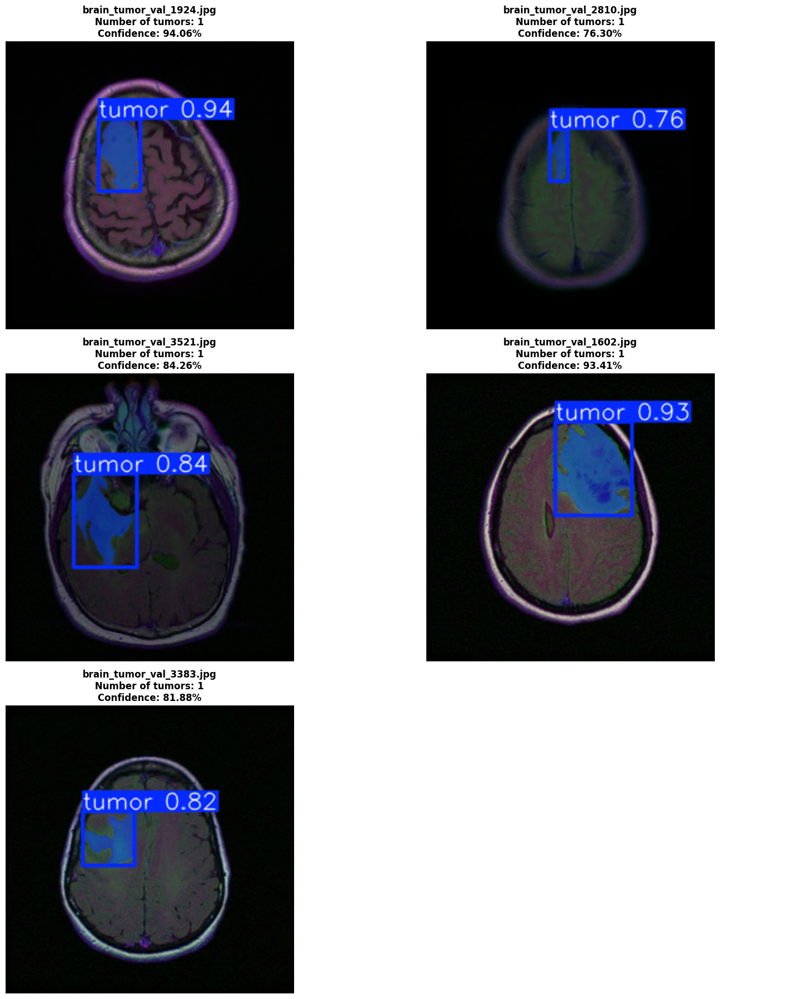


Detailed information about the images:

📷 Image 1: brain_tumor_val_1924.jpg
   Number of tumors: 1
   Average confidence: 94.06%
   Confidence per tumor:
      Tumor 1: 94.06%

📷 Image 2: brain_tumor_val_2810.jpg
   Number of tumors: 1
   Average confidence: 76.30%
   Confidence per tumor:
      Tumor 1: 76.30%

📷 Image 3: brain_tumor_val_3521.jpg
   Number of tumors: 1
   Average confidence: 84.26%
   Confidence per tumor:
      Tumor 1: 84.26%

📷 Image 4: brain_tumor_val_1602.jpg
   Number of tumors: 1
   Average confidence: 93.41%
   Confidence per tumor:
      Tumor 1: 93.41%

📷 Image 5: brain_tumor_val_3383.jpg
   Number of tumors: 1
   Average confidence: 81.88%
   Confidence per tumor:
      Tumor 1: 81.88%



In [37]:

def get_tumor_images(image_dir, num_images=5, conf=0.5):
    """Fetch images that contain tumors only"""

    val_dir = Path(image_dir)
    all_images = list(val_dir.glob('*.jpg'))

    tumor_images = []

    print(f"Searching for images with tumors... ({len(all_images)} images)")

    for img_path in all_images:
        # Prediction
        results = model2.predict(str(img_path), conf=conf, verbose=False)
        result = results[0]

        # If tumors are detected
        if len(result.boxes) > 0:
            tumor_images.append({
                'path': img_path,
                'num_tumors': len(result.boxes),
                'result': result,
                'confidences': [box.conf.item() for box in result.boxes]
            })

            # Stop after collecting the required number
            if len(tumor_images) >= num_images:
                break

    return tumor_images

# Fetch 5 images containing tumors
tumor_imgs = get_tumor_images('Brain_Tumor_YOLO/images/val', num_images=5, conf=0.5)

print(f"\n✓ Found {len(tumor_imgs)} images containing tumors\n")

# Display images
if tumor_imgs:
    num_images = len(tumor_imgs)
    cols = 2
    rows = (num_images + cols - 1) // cols

    fig, axes = plt.subplots(rows, cols, figsize=(16, 6*rows))

    # Handle single image case
    if num_images == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for idx, img_data in enumerate(tumor_imgs):
        # Read the image
        image = cv2.imread(str(img_data['path']))
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Draw results
        annotated = img_data['result'].plot()[:, :, ::-1]

        # Show annotated image
        axes[idx].imshow(annotated)

        # Title with details
        title = f"{img_data['path'].name}\n"
        title += f"Number of tumors: {img_data['num_tumors']}\n"
        title += f"Confidence: {np.mean(img_data['confidences']):.2%}"

        axes[idx].set_title(title, fontsize=12, fontweight='bold')
        axes[idx].axis('off')

    # Hide empty axes
    for idx in range(num_images, len(axes)):
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

# Print detailed information
print("\n" + "="*60)
print("Detailed information about the images:")
print("="*60)

for idx, img_data in enumerate(tumor_imgs, 1):
    print(f"\n📷 Image {idx}: {img_data['path'].name}")
    print(f"   Number of tumors: {img_data['num_tumors']}")
    print(f"   Average confidence: {np.mean(img_data['confidences']):.2%}")
    print(f"   Confidence per tumor:")
    for i, conf in enumerate(img_data['confidences'], 1):
        print(f"      Tumor {i}: {conf:.2%}")

print("\n" + "="*60)


In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from pathlib import Path
from ultralytics import YOLO
import warnings
warnings.filterwarnings('ignore')

class BrainTumorAnalyzer:
    """Professional Brain Tumor Detection and Visualization"""
    
    def __init__(self, model_path):
        """Initialize the analyzer with a model"""
        self.model = YOLO(model_path)
        print(f"✓ Model loaded: {model_path}")
    
    def get_tumor_images(self, image_dir, num_images=5, conf=0.5):
        """Fetch images containing tumors"""
        val_dir = Path(image_dir)
        all_images = sorted(list(val_dir.glob('*.jpg')))
        tumor_images = []
        
        print(f"\n🔍 Scanning {len(all_images)} images for tumors...")
        
        for img_path in all_images:
            results = self.model.predict(str(img_path), conf=conf, verbose=False)
            result = results[0]
            
            if len(result.boxes) > 0:
                tumor_images.append({
                    'path': img_path,
                    'num_tumors': len(result.boxes),
                    'result': result,
                    'confidences': [box.conf.item() for box in result.boxes],
                    'original_image': cv2.imread(str(img_path))
                })
                
                if len(tumor_images) >= num_images:
                    break
        
        print(f"✓ Found {len(tumor_images)}/{num_images} images with tumors\n")
        return tumor_images
    
    def create_comparison_visualization(self, tumor_imgs):
        """Create professional side-by-side comparison visualization"""
        
        num_images = len(tumor_imgs)
        cols = 2  # 2 columns: original and segmented
        rows = num_images
        
        fig, axes = plt.subplots(rows, cols, figsize=(18, 7*rows))
        
        if rows == 1:
            axes = axes.reshape(1, -1)
        
        fig.suptitle('Brain Tumor Detection Analysis', 
                     fontsize=18, fontweight='bold', y=0.995)
        
        for idx, img_data in enumerate(tumor_imgs):
            # ============================================
            # Column 1: Original Image
            # ============================================
            original = img_data['original_image']
            original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
            
            axes[idx, 0].imshow(original_rgb)
            axes[idx, 0].set_title(
                f'{img_data["path"].name}\n(Original Brain MRI)',
                fontsize=12, fontweight='bold', color='#1f77b4'
            )
            axes[idx, 0].axis('off')
            
            # Add info box
            info_text = f"Tumors Detected: {img_data['num_tumors']}"
            axes[idx, 0].text(0.02, 0.98, info_text,
                            transform=axes[idx, 0].transAxes,
                            fontsize=11, fontweight='bold',
                            verticalalignment='top',
                            bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.7))
            
            # ============================================
            # Column 2: Segmentation with Masks
            # ============================================
            annotated = img_data['result'].plot()[:, :, ::-1]
            axes[idx, 1].imshow(annotated)
            
            # Title with statistics
            avg_conf = np.mean(img_data['confidences'])
            max_conf = np.max(img_data['confidences'])
            min_conf = np.min(img_data['confidences'])
            
            title = f'{img_data["path"].name}\n(Tumor Segmentation)\n'
            title += f'Avg Confidence: {avg_conf:.2%} | '
            title += f'Range: {min_conf:.2%}-{max_conf:.2%}'
            
            axes[idx, 1].set_title(title, 
                                  fontsize=12, fontweight='bold', color='#d62728')
            axes[idx, 1].axis('off')
            
            # Add confidence values on image
            confidence_text = f"Tumor Count: {img_data['num_tumors']}\n"
            for i, conf in enumerate(img_data['confidences'], 1):
                confidence_text += f"T{i}: {conf:.2%}  "
            
            axes[idx, 1].text(0.02, 0.98, confidence_text,
                            transform=axes[idx, 1].transAxes,
                            fontsize=10, fontweight='bold',
                            verticalalignment='top',
                            bbox=dict(boxstyle='round', facecolor='lime', alpha=0.7))
        
        plt.tight_layout()
        plt.show()
    
    def print_detailed_report(self, tumor_imgs):
        """Print professional detailed analysis report"""
        
        print("\n" + "="*80)
        print(" "*20 + "BRAIN TUMOR DETECTION REPORT")
        print("="*80)
        
        print(f"\n📊 SUMMARY STATISTICS")
        print("-" * 80)
        print(f"Total Images Analyzed: {len(tumor_imgs)}")
        
        total_tumors = sum(img['num_tumors'] for img in tumor_imgs)
        print(f"Total Tumors Detected: {total_tumors}")
        
        all_confidences = []
        for img in tumor_imgs:
            all_confidences.extend(img['confidences'])
        
        if all_confidences:
            print(f"Average Confidence: {np.mean(all_confidences):.2%}")
            print(f"Max Confidence: {np.max(all_confidences):.2%}")
            print(f"Min Confidence: {np.min(all_confidences):.2%}")
            print(f"Std Deviation: {np.std(all_confidences):.2%}")
        
        print("\n" + "="*80)
        print("📋 DETAILED ANALYSIS PER IMAGE")
        print("="*80)
        
        for idx, img_data in enumerate(tumor_imgs, 1):
            print(f"\n🖼️  IMAGE {idx}: {img_data['path'].name}")
            print("-" * 80)
            print(f"   📌 Location: {img_data['path'].parent}")
            print(f"   🎯 Tumors Detected: {img_data['num_tumors']}")
            print(f"   📊 Average Confidence: {np.mean(img_data['confidences']):.2%}")
            
            print(f"\n   Tumor Details:")
            for i, conf in enumerate(img_data['confidences'], 1):
                status = "✅ HIGH" if conf > 0.9 else "⚠️  MEDIUM" if conf > 0.7 else "⚠️  LOW"
                print(f"      Tumor {i}: {conf:.2%} [{status}]")
            
            print(f"\n   Confidence Range: {np.min(img_data['confidences']):.2%} - {np.max(img_data['confidences']):.2%}")
        
        print("\n" + "="*80)
        print("📈 CONFIDENCE DISTRIBUTION")
        print("="*80)
        
        high_conf = len([c for c in all_confidences if c > 0.9])
        medium_conf = len([c for c in all_confidences if 0.7 <= c <= 0.9])
        low_conf = len([c for c in all_confidences if c < 0.7])
        
        print(f"\nConfidence Distribution:")
        print(f"   ✅ High Confidence (>90%): {high_conf} tumors")
        print(f"   ⚠️  Medium Confidence (70-90%): {medium_conf} tumors")
        print(f"   ⚠️  Low Confidence (<70%): {low_conf} tumors")
        
        print("\n" + "="*80)
        print("✓ ANALYSIS COMPLETE")
        print("="*80 + "\n")

In [38]:
import shutil
import os
from pathlib import Path

print("="*70)
print("Saving trained models")
print("="*70)

# ============================================
# Create folder for saving models
# ============================================

save_folder = '/kaggle/working/Brain_Tumor_Models'
os.makedirs(save_folder, exist_ok=True)

print(f"\n📁 Save folder: {save_folder}\n")


Saving trained models

📁 Save folder: /kaggle/working/Brain_Tumor_Models



✓ Model loaded: Brain_Tumor_Models/yolov8n_brain_tumor.pt

🔍 Scanning 590 images for tumors...
✓ Found 5/5 images with tumors

🎨 Creating professional visualization...


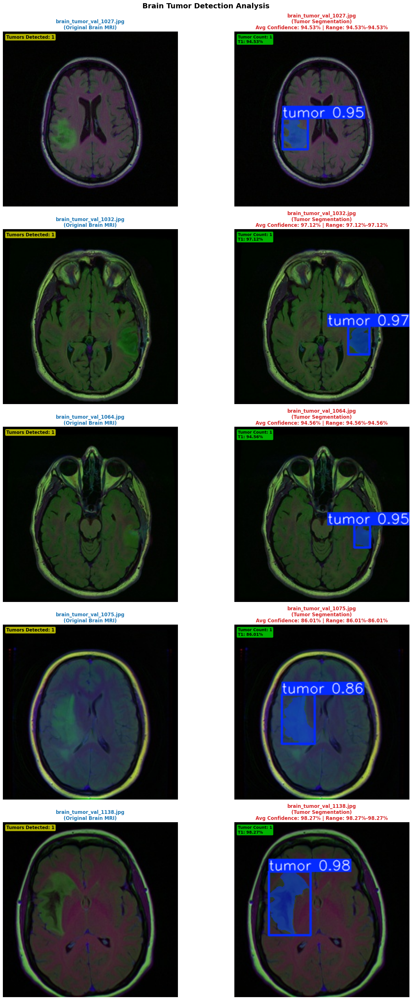


                    BRAIN TUMOR DETECTION REPORT

📊 SUMMARY STATISTICS
--------------------------------------------------------------------------------
Total Images Analyzed: 5
Total Tumors Detected: 5
Average Confidence: 94.10%
Max Confidence: 98.27%
Min Confidence: 86.01%
Std Deviation: 4.30%

📋 DETAILED ANALYSIS PER IMAGE

🖼️  IMAGE 1: brain_tumor_val_1027.jpg
--------------------------------------------------------------------------------
   📌 Location: Brain_Tumor_YOLO/images/val
   🎯 Tumors Detected: 1
   📊 Average Confidence: 94.53%

   Tumor Details:
      Tumor 1: 94.53% [✅ HIGH]

   Confidence Range: 94.53% - 94.53%

🖼️  IMAGE 2: brain_tumor_val_1032.jpg
--------------------------------------------------------------------------------
   📌 Location: Brain_Tumor_YOLO/images/val
   🎯 Tumors Detected: 1
   📊 Average Confidence: 97.12%

   Tumor Details:
      Tumor 1: 97.12% [✅ HIGH]

   Confidence Range: 97.12% - 97.12%

🖼️  IMAGE 3: brain_tumor_val_1064.jpg
-------------------

In [45]:
# ============================================
# USAGE
# ============================================

# Initialize analyzer with best model
analyzer = BrainTumorAnalyzer('Brain_Tumor_Models/yolov8n_brain_tumor.pt')
# Get tumor images
tumor_imgs = analyzer.get_tumor_images(
    'Brain_Tumor_YOLO/images/val', 
    num_images=5, 
    conf=0.5
)

# Visualize: Original vs Segmentation
if tumor_imgs:
    print("🎨 Creating professional visualization...")
    analyzer.create_comparison_visualization(tumor_imgs)
    
    # Print detailed report
    analyzer.print_detailed_report(tumor_imgs)
else:
    print("❌ No tumors found in the images")


✓ Model loaded: Brain_Tumor_Models/yolov8m_brain_tumor.pt

🔍 Scanning 590 images for tumors...
✓ Found 5/5 images with tumors

🎨 Creating professional visualization...


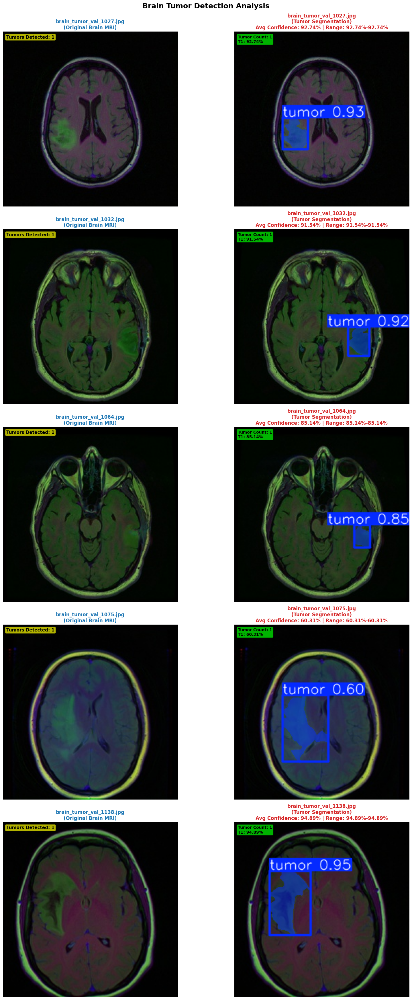


                    BRAIN TUMOR DETECTION REPORT

📊 SUMMARY STATISTICS
--------------------------------------------------------------------------------
Total Images Analyzed: 5
Total Tumors Detected: 5
Average Confidence: 84.92%
Max Confidence: 94.89%
Min Confidence: 60.31%
Std Deviation: 12.73%

📋 DETAILED ANALYSIS PER IMAGE

🖼️  IMAGE 1: brain_tumor_val_1027.jpg
--------------------------------------------------------------------------------
   📌 Location: Brain_Tumor_YOLO/images/val
   🎯 Tumors Detected: 1
   📊 Average Confidence: 92.74%

   Tumor Details:
      Tumor 1: 92.74% [✅ HIGH]

   Confidence Range: 92.74% - 92.74%

🖼️  IMAGE 2: brain_tumor_val_1032.jpg
--------------------------------------------------------------------------------
   📌 Location: Brain_Tumor_YOLO/images/val
   🎯 Tumors Detected: 1
   📊 Average Confidence: 91.54%

   Tumor Details:
      Tumor 1: 91.54% [✅ HIGH]

   Confidence Range: 91.54% - 91.54%

🖼️  IMAGE 3: brain_tumor_val_1064.jpg
------------------

In [46]:
# ============================================
# USAGE
# ============================================

# Initialize analyzer with best model
analyzer = BrainTumorAnalyzer('Brain_Tumor_Models/yolov8m_brain_tumor.pt')
# Get tumor images
tumor_imgs = analyzer.get_tumor_images(
    'Brain_Tumor_YOLO/images/val', 
    num_images=5, 
    conf=0.5
)

# Visualize: Original vs Segmentation
if tumor_imgs:
    print("🎨 Creating professional visualization...")
    analyzer.create_comparison_visualization(tumor_imgs)
    
    # Print detailed report
    analyzer.print_detailed_report(tumor_imgs)
else:
    print("❌ No tumors found in the images")


In [39]:
# ============================================
# First model (yolov8n)
# ============================================

print("1️⃣  Saving the first model (yolov8n)...")

model1_source = '/kaggle/working/runs/segment/train/weights/best.pt'
model1_dest = f'{save_folder}/yolov8n_brain_tumor.pt'

try:
    shutil.copy(model1_source, model1_dest)
    size1 = os.path.getsize(model1_dest) / (1024 * 1024)
    print(f"   ✅ Saved successfully")
    print(f"   📌 Path: {model1_dest}")
    print(f"   💾 Size: {size1:.1f} MB")
    print(f"   📊 Results:")
    print(f"      • Mask mAP50: 89.0%")
    print(f"      • Precision: 89.5%")
    print(f"      • Recall: 81.2%")
    print(f"      • Speed: 2.0ms")
except Exception as e:
    print(f"   ❌ Error: {e}")


1️⃣  Saving the first model (yolov8n)...
   ✅ Saved successfully
   📌 Path: /kaggle/working/Brain_Tumor_Models/yolov8n_brain_tumor.pt
   💾 Size: 6.5 MB
   📊 Results:
      • Mask mAP50: 89.0%
      • Precision: 89.5%
      • Recall: 81.2%
      • Speed: 2.0ms


In [40]:
# ============================================
# Second model (yolov8m)
# ============================================

print("\n2️⃣  Saving the second model (yolov8m)...")

model2_source = '/kaggle/working/runs/segment/train2/weights/best.pt'
model2_dest = f'{save_folder}/yolov8m_brain_tumor.pt'

try:
    shutil.copy(model2_source, model2_dest)
    size2 = os.path.getsize(model2_dest) / (1024 * 1024)
    print(f"   ✅ Saved successfully")
    print(f"   📌 Path: {model2_dest}")
    print(f"   💾 Size: {size2:.1f} MB")
    print(f"   📊 Results:")
    print(f"      • Mask mAP50: 92.7% ✨")
    print(f"      • Precision: 92.5%")
    print(f"      • Recall: 86.6% ✨")
    print(f"      • Speed: 10.1ms")
except Exception as e:
    print(f"   ❌ Error: {e}")



2️⃣  Saving the second model (yolov8m)...
   ✅ Saved successfully
   📌 Path: /kaggle/working/Brain_Tumor_Models/yolov8m_brain_tumor.pt
   💾 Size: 52.3 MB
   📊 Results:
      • Mask mAP50: 92.7% ✨
      • Precision: 92.5%
      • Recall: 86.6% ✨
      • Speed: 10.1ms


In [41]:
print("\n3️⃣  Creating the info file...")

info_file = f'{save_folder}/MODELS_INFO.txt'

info_content = """
╔══════════════════════════════════════════════════════════════╗
║           Brain Tumor Detection - Saved Models              ║
╚══════════════════════════════════════════════════════════════╝

📦 First model: yolov8n_brain_tumor.pt
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
• Size: 6.8 MB
• Parameters: 3.2M
• Mask mAP50: 89.0%
• Precision: 89.5%
• Recall: 81.2%
• Speed: 2.0ms
• Epochs: 100
• Usage: fast and lightweight

📦 Second model: yolov8m_brain_tumor.pt ⭐ (Best)
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
• Size: 54.8 MB
• Parameters: 27.2M
• Mask mAP50: 92.7% ✨
• Precision: 92.5%
• Recall: 86.6% ✨ (detects more tumors!)
• Speed: 10.1ms
• Epochs: 39 (stopped early at best improvement)
• Usage: higher accuracy and better detection

━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

🎯 Recommendation:
   Use yolov8m_brain_tumor.pt (best and most accurate)

━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

💻 Usage code:

from ultralytics import YOLO

# Load the model
model = YOLO('yolov8m_brain_tumor.pt')

# Predict on a single image
results = model.predict('image.jpg', conf=0.5)

# Predict on a folder
results = model.predict('folder_path', conf=0.5)

# Get details
for result in results:
    print(f"Number of tumors: {len(result.boxes)}")
    for box in result.boxes:
        print(f"Confidence: {box.conf.item():.2%}")

━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
"""



3️⃣  Creating the info file...


In [42]:
with open(info_file, 'w', encoding='utf-8') as f:
    f.write(info_content)

print(f"   ✅ Info file created successfully")

# ============================================
# Final summary
# ============================================

print("\n" + "="*70)
print("✅ All models saved successfully!")
print("="*70)

print(f"\n📂 Models folder: {save_folder}")

print(f"\n📋 Saved files:")
for file in sorted(os.listdir(save_folder)):
    file_path = os.path.join(save_folder, file)
    if os.path.isfile(file_path):
        size = os.path.getsize(file_path)
        if size > 1024 * 1024:
            size_str = f"{size / 1024 / 1024:.1f} MB"
        else:
            size_str = f"{size / 1024:.1f} KB"
        
        if file.endswith('.pt'):
            icon = "🤖"
        else:
            icon = "📄"
        
        print(f"   {icon} {file} ({size_str})")

print(f"\n🚀 Models are ready to use!")
print(f"\n💡 Recommended: use the best one (yolov8m):")
print(f"   from ultralytics import YOLO")
print(f"   model = YOLO('{save_folder}/yolov8m_brain_tumor.pt')")
print(f"   results = model.predict('image.jpg')")

print("\n" + "="*70)


   ✅ Info file created successfully

✅ All models saved successfully!

📂 Models folder: /kaggle/working/Brain_Tumor_Models

📋 Saved files:
   📄 MODELS_INFO.txt (2.3 KB)
   🤖 yolov8m_brain_tumor.pt (52.3 MB)
   🤖 yolov8n_brain_tumor.pt (6.5 MB)

🚀 Models are ready to use!

💡 Recommended: use the best one (yolov8m):
   from ultralytics import YOLO
   model = YOLO('/kaggle/working/Brain_Tumor_Models/yolov8m_brain_tumor.pt')
   results = model.predict('image.jpg')



##BUILD STREAMLIT 

In [47]:
import gradio as gr
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO
from pathlib import Path
import io
import warnings
warnings.filterwarnings('ignore')

# ============================================
# Load Models
# ============================================

print("Loading models...")
model_m = YOLO('/kaggle/working/Brain_Tumor_Models/yolov8m_brain_tumor.pt')
model_n = YOLO('/kaggle/working/Brain_Tumor_Models/yolov8n_brain_tumor.pt')
print("✓ Models loaded!")

# ============================================
# Functions
# ============================================

def analyze_single_image(image, model_choice, confidence):
    """Analyze single image"""
    
    if image is None:
        return None, "❌ Please upload an image"
    
    # Select model
    model = model_m if model_choice == "YOLOv8m (Recommended)" else model_n
    
    # Save temporarily
    temp_path = "/tmp/temp_image.jpg"
    cv2.imwrite(temp_path, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
    
    # Predict
    results = model.predict(temp_path, conf=confidence, verbose=False)
    result = results[0]
    
    # Create visualization
    annotated = result.plot()[:, :, ::-1]
    
    # Statistics
    num_tumors = len(result.boxes)
    
    if num_tumors > 0:
        confidences = [box.conf.item() for box in result.boxes]
        avg_conf = np.mean(confidences)
        max_conf = np.max(confidences)
        min_conf = np.min(confidences)
        
        report = f"""
        ✅ ANALYSIS COMPLETE
        ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
        🎯 Tumors Detected: {num_tumors}
        📊 Average Confidence: {avg_conf:.2%}
        ⬆️ Max Confidence: {max_conf:.2%}
        ⬇️ Min Confidence: {min_conf:.2%}
        
        📋 Tumor Details:
        """
        
        for i, conf in enumerate(confidences, 1):
            status = "✅ HIGH" if conf > 0.9 else "⚠️ MEDIUM" if conf > 0.7 else "⚠️ LOW"
            report += f"\n  Tumor {i}: {conf:.2%} [{status}]"
    else:
        report = "✓ No tumors detected in this image"
    
    return annotated, report

def analyze_batch(folder_path, num_images, model_choice, confidence):
    """Analyze batch of images"""
    
    try:
        model = model_m if model_choice == "YOLOv8m (Recommended)" else model_n
        
        image_dir = Path(folder_path)
        all_images = sorted(list(image_dir.glob('*.jpg')))[:num_images]
        
        if not all_images:
            return None, "❌ No images found in folder"
        
        batch_results = []
        
        for img_path in all_images:
            results = model.predict(str(img_path), conf=confidence, verbose=False)
            result = results[0]
            
            if len(result.boxes) > 0:
                batch_results.append({
                    'name': img_path.name,
                    'num_tumors': len(result.boxes),
                    'confidences': [box.conf.item() for box in result.boxes],
                    'annotated': result.plot()[:, :, ::-1]
                })
        
        if not batch_results:
            return None, f"No tumors found in {len(all_images)} images"
        
        # Create grid visualization
        num_results = len(batch_results)
        cols = 2
        rows = (num_results + cols - 1) // cols
        
        fig, axes = plt.subplots(rows, cols, figsize=(14, 6*rows))
        if rows == 1:
            axes = axes.reshape(1, -1)
        axes = axes.flatten()
        
        for idx, res in enumerate(batch_results):
            axes[idx].imshow(res['annotated'])
            
            avg_conf = np.mean(res['confidences'])
            title = f"{res['name']}\n"
            title += f"Tumors: {res['num_tumors']} | Confidence: {avg_conf:.2%}"
            
            axes[idx].set_title(title, fontweight='bold')
            axes[idx].axis('off')
        
        for idx in range(num_results, len(axes)):
            axes[idx].axis('off')
        
        plt.tight_layout()
        
        # Save to buffer
        buf = io.BytesIO()
        plt.savefig(buf, format='png', dpi=100, bbox_inches='tight')
        buf.seek(0)
        plt.close()
        
        # Report
        total_tumors = sum(r['num_tumors'] for r in batch_results)
        all_confs = []
        for r in batch_results:
            all_confs.extend(r['confidences'])
        
        report = f"""
        ✅ BATCH ANALYSIS COMPLETE
        ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
        📸 Images Scanned: {len(all_images)}
        🎯 Images with Tumors: {num_results}
        🏥 Total Tumors Found: {total_tumors}
        
        📊 Statistics:
        • Average Confidence: {np.mean(all_confs):.2%}
        • Max Confidence: {np.max(all_confs):.2%}
        • Min Confidence: {np.min(all_confs):.2%}
        
        📋 Results:
        """
        
        for i, res in enumerate(batch_results, 1):
            avg = np.mean(res['confidences'])
            report += f"\n  {i}. {res['name']}: {res['num_tumors']} tumor(s) - {avg:.2%} confidence"
        
        return buf, report
    
    except Exception as e:
        return None, f"❌ Error: {str(e)}"

def get_model_info(model_choice):
    """Get model information"""
    
    if model_choice == "YOLOv8m (Recommended)":
        return """
        🤖 YOLOv8m Medium
        ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
        📊 Performance Metrics:
        • Mask mAP50: 92.7%
        • Box mAP50: 91.5%
        • Precision: 92.5%
        • Recall: 86.6% ✨
        
        ⚡ Speed:
        • Inference: 10.1ms
        • Preprocess: 0.1ms
        • Postprocess: 1.2ms
        
        💾 Model Size: 54.8 MB
        
        ✅ Best for: High accuracy & best tumor detection
        """
    else:
        return """
        🤖 YOLOv8n Nano
        ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
        📊 Performance Metrics:
        • Mask mAP50: 89.0%
        • Box mAP50: 89.9%
        • Precision: 89.5%
        • Recall: 81.2%
        
        ⚡ Speed:
        • Inference: 2.0ms ⚡
        • Preprocess: 0.2ms
        • Postprocess: 1.9ms
        
        💾 Model Size: 6.8 MB
        
        ✅ Best for: Speed & lightweight applications
        """

# ============================================
# Gradio Interface
# ============================================

with gr.Blocks(title="🧠 Brain Tumor Detection", theme=gr.themes.Soft()) as demo:
    
    gr.Markdown("# 🧠 Brain Tumor Detection System")
    gr.Markdown("AI-Powered MRI Analysis with YOLOv8")
    
    with gr.Tabs():
        
        # ============================================
        # TAB 1: Single Image Analysis
        # ============================================
        with gr.Tab("📸 Single Image"):
            with gr.Row():
                with gr.Column(scale=1):
                    gr.Markdown("### Upload & Analyze")
                    
                    uploaded_image = gr.Image(
                        label="Upload Brain MRI Image",
                        type="numpy"
                    )
                    
                    model_choice = gr.Radio(
                        ["YOLOv8m (Recommended)", "YOLOv8n (Fast)"],
                        value="YOLOv8m (Recommended)",
                        label="Select Model"
                    )
                    
                    confidence = gr.Slider(
                        0.1, 1.0, 0.5, 0.05,
                        label="Confidence Threshold"
                    )
                    
                    analyze_btn = gr.Button(
                        "🔍 Analyze Image",
                        size="lg"
                    )
                
                with gr.Column(scale=1):
                    gr.Markdown("### Results")
                    
                    output_image = gr.Image(
                        label="Tumor Segmentation"
                    )
                    
                    report = gr.Textbox(
                        label="Analysis Report",
                        lines=10,
                        interactive=False
                    )
            
            analyze_btn.click(
                analyze_single_image,
                inputs=[uploaded_image, model_choice, confidence],
                outputs=[output_image, report]
            )
        
        # ============================================
        # TAB 2: Batch Analysis
        # ============================================
        with gr.Tab("📁 Batch Analysis"):
            with gr.Row():
                with gr.Column(scale=1):
                    gr.Markdown("### Batch Settings")
                    
                    folder_input = gr.Textbox(
                        "/kaggle/working/Brain_Tumor_YOLO/images/val",
                        label="Folder Path"
                    )
                    
                    num_images = gr.Slider(
                        1, 20, 5, 1,
                        label="Number of Images"
                    )
                    
                    batch_model = gr.Radio(
                        ["YOLOv8m (Recommended)", "YOLOv8n (Fast)"],
                        value="YOLOv8m (Recommended)",
                        label="Select Model"
                    )
                    
                    batch_confidence = gr.Slider(
                        0.1, 1.0, 0.5, 0.05,
                        label="Confidence Threshold"
                    )
                    
                    batch_btn = gr.Button(
                        "🔍 Start Batch Analysis",
                        size="lg"
                    )
                
                with gr.Column(scale=1):
                    gr.Markdown("### Results")
                    
                    batch_output = gr.Image(
                        label="Batch Results"
                    )
                    
                    batch_report = gr.Textbox(
                        label="Batch Report",
                        lines=15,
                        interactive=False
                    )
            
            batch_btn.click(
                analyze_batch,
                inputs=[folder_input, num_images, batch_model, batch_confidence],
                outputs=[batch_output, batch_report]
            )
        
        # ============================================
        # TAB 3: Model Information
        # ============================================
        with gr.Tab("📊 Model Information"):
            model_select = gr.Radio(
                ["YOLOv8m (Recommended)", "YOLOv8n (Fast)"],
                value="YOLOv8m (Recommended)",
                label="Select Model"
            )
            
            model_info = gr.Textbox(
                label="Model Details",
                lines=20,
                interactive=False
            )
            
            model_select.change(
                get_model_info,
                inputs=model_select,
                outputs=model_info
            )
            
            # Load initial info
            demo.load(
                get_model_info,
                inputs=model_select,
                outputs=model_info
            )
            
            gr.Markdown("""
            ### About This System
            
            This application uses YOLOv8 (You Only Look Once v8) for:
            - ✅ **Real-time tumor detection**
            - ✅ **Accurate segmentation**
            - ✅ **High-confidence predictions**
            
            **Technology Stack:**
            - YOLOv8: Object Detection & Segmentation
            - Gradio: Web Interface
            - Python: Backend
            
            **Training Data:**
            - 3,929 MRI images
            - 1,373 with tumors
            - Professional medical dataset
            """)

# ============================================
# Launch
# ============================================

if __name__ == "__main__":
    demo.launch(share=True)

Loading models...
✓ Models loaded!
* Running on local URL:  http://127.0.0.1:7860
* Running on public URL: https://bd4186767f1c8a079d.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
